<a href="https://colab.research.google.com/github/luisagalvis/trabajo-parte-practica/blob/main/copia_de_estadisticaipython1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import io
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt
from scipy.stats import shapiro
import plotly.express as px
from scipy.stats import skew, kurtosis
from sklearn.linear_model import LinearRegression
from scipy.stats import spearmanr, kendalltau

# Estadística descriptiva para variables cuantitativas


*   Gráficos para datos unviariados cuantitativos
*   Determinar las medidas descriptivas para datos datos univariados cuantitativos

# Trabajo Segundo Parcial Parte Práctica

**INTEGRANTES**


*   Luisa Galvis - 2203044
*   Lizeth Sánchez - 2202869
*   Oscar Ariza -  2202502
*   Daniel Carillo - 2192309






In [ ]:
from google.colab import files # Para cargar archivos en google colab
uploaded = files.upload()

In [ ]:
io_csv = io.BytesIO(uploaded['nac2020.csv'])
tabla = pd.read_csv(io_csv, sep = ",", index_col=0, encoding='latin-1')
tabla.head(3)

,COD_MUNIC,AREANAC,SIT_PARTO,OTRO_SIT,SEXO,PESO_NAC,TALLA_NAC,ANO,MES,ATEN_PAR,...,AREA_RES,N_HIJOSV,FECHA_NACM,N_EMB,SEG_SOCIAL,IDCLASADMI,EDAD_PADRE,NIV_EDUP,ULTCURPAD,PROFESION
COD_DPTO,,,,,,,,,,,,,,,,,,,,,
44,560,3,2,NaN,2,9,9,2020,11,5,...,3.0,1,NaN,1,2,2.0,20,99,99,5
44,560,3,2,NaN,1,9,9,2020,10,5,...,3.0,1,NaN,1,2,2.0,20,99,99,5
44,560,3,2,NaN,1,9,9,2020,10,5,...,3.0,1,NaN,1,2,2.0,20,99,99,5


In [ ]:
df = tabla[["EDAD_PADRE",  "N_EMB"]]
df.head(3)

,EDAD_PADRE,N_EMB
COD_DPTO,,
44,20,1
44,20,1
44,20,1


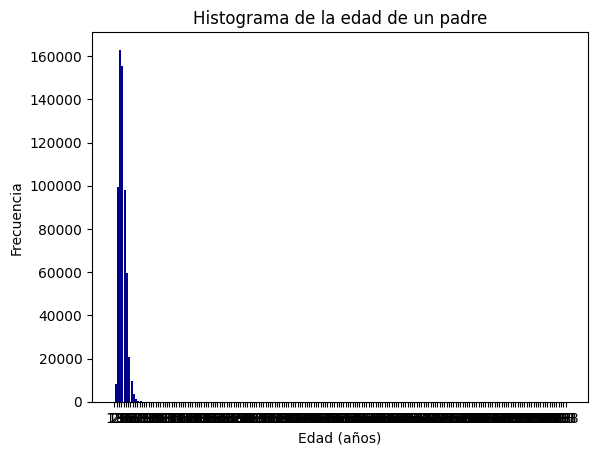

In [ ]:
intervalos = range(min(df.EDAD_PADRE), max(df.EDAD_PADRE) + 1, 5)
plt.hist(df.EDAD_PADRE, bins=intervalos, color='darkblue', rwidth=0.85)
plt.title('Histograma de la edad de un padre')
plt.xlabel('Edad (años)')
plt.ylabel('Frecuencia')
plt.xticks(intervalos)
plt.show()

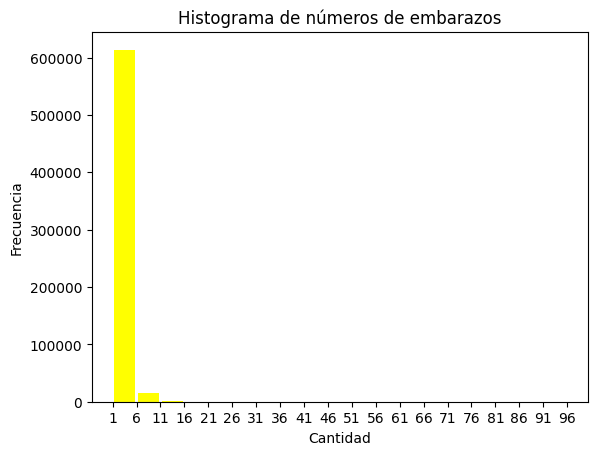

In [ ]:
intervalos = range(min(df.N_EMB), max(df.N_EMB) + 1, 5)
plt.hist(df.N_EMB, bins=intervalos, color='yellow', rwidth=0.85)
plt.title('Histograma de números de embarazos')
plt.xlabel('Cantidad')
plt.ylabel('Frecuencia')
plt.xticks(intervalos)
plt.show()

In [ ]:
df1 = df[(df.EDAD_PADRE < 120)  & (df.N_EMB != 99)]
df1.head(5)

,EDAD_PADRE,N_EMB
COD_DPTO,,
44,20,1
44,20,1
44,20,1
44,20,1
44,20,1


<ipython-input-10-9ae029899899>:9: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(x, p, 'k', linewidth=2, label='Distribución Normal', color = "darkblue")


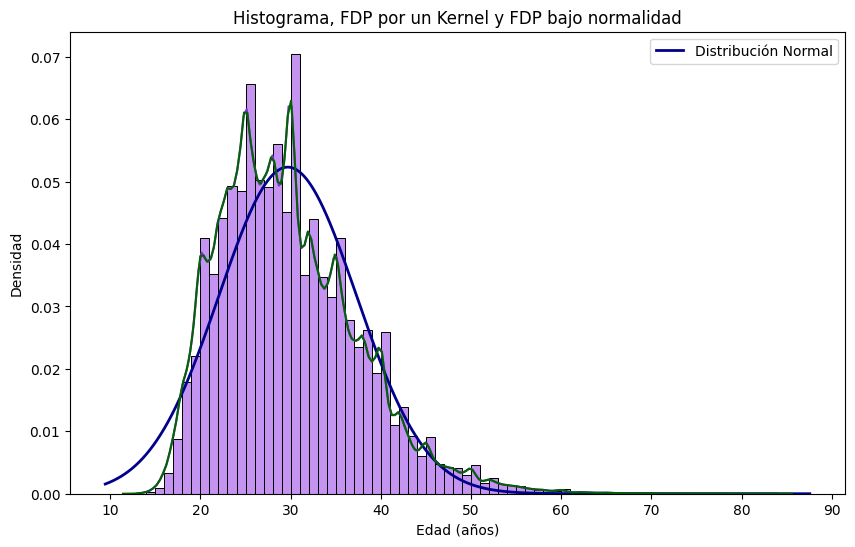

In [ ]:
intervalos1 = range(min(df1.EDAD_PADRE), max(df1.EDAD_PADRE) + 1)
plt.figure(figsize=(10, 6))
sns.histplot(x = df1.EDAD_PADRE, bins = intervalos1, kde = True, stat = "density", color = "blueviolet", edgecolor='black') # kde = True es la gráfica de la función de densidad de probabilidad estimada por un método Kernell

xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 1000)
p = norm.pdf(x, np.mean(df1.EDAD_PADRE), np.std(df1.EDAD_PADRE))

plt.plot(x, p, 'k', linewidth=2, label='Distribución Normal', color = "darkblue")
sns.kdeplot(x=df1.EDAD_PADRE, color = "darkgreen")

plt.title('Histograma, FDP por un Kernel y FDP bajo normalidad')
plt.xlabel('Edad (años)')
plt.ylabel('Densidad')
plt.legend()

# Mostrar el gráfico
plt.show()

Sea $X:=$ Edad del padre de un recién nacido en Colombia.

Descriptivamente como la función de densidad de probabilidad de los datos estimada por un método Kernel (línea cyan) no coincide con la función de densidad de probabilidad asumiendo el supuesto de normalidad (línea azul), $X\sim \text{Normal} (\text{Media} = \bar{x}, \text{Varianza} = S^2_x)$, entonces no asumimos normalidad

<ipython-input-33-5c60e0e6aafb>:9: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.



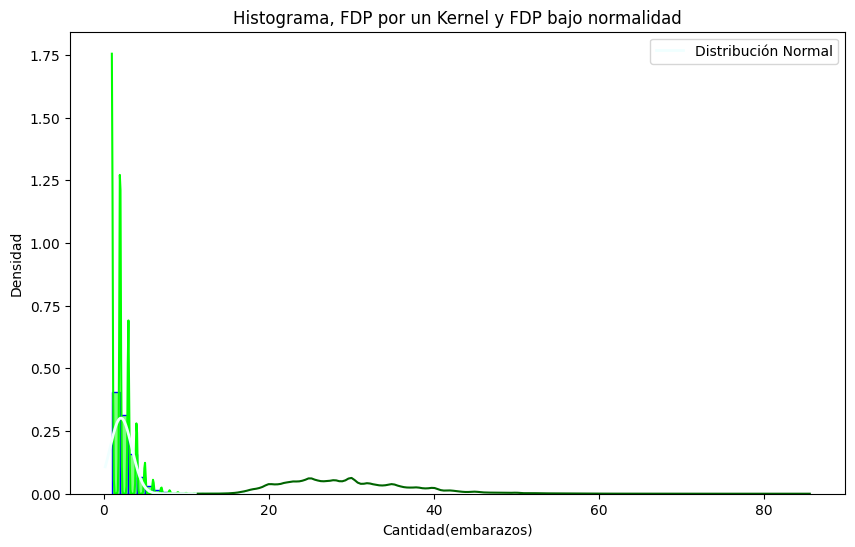

In [ ]:
intervalos1 = range(min(df1.N_EMB), max(df1.N_EMB) + 1)
plt.figure(figsize=(10, 6))
sns.histplot(x = df1.N_EMB, bins = intervalos1, kde = True, stat = "density", color = "lime", edgecolor='blue') # kde = True es la gráfica de la función de densidad de probabilidad estimada por un método Kernell

xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 1000)
p = norm.pdf(x, np.mean(df1.N_EMB), np.std(df1.N_EMB))

plt.plot(x, p, 'k', linewidth=2, label='Distribución Normal', color = "azure")
sns.kdeplot(x=df1.EDAD_PADRE, color = "darkgreen")

plt.title('Histograma, FDP por un Kernel y FDP bajo normalidad')
plt.xlabel('Cantidad(embarazos)')
plt.ylabel('Densidad')
plt.legend()

# Mostrar el gráfico
plt.show()

Sea $X:=$ Número de embarazos teniendo en cuenta el presente, en Colombia.

Descriptivamente como la función de densidad de probabilidad de los datos estimada por un método Kernel (línea cyan) no coincide con la función de densidad de probabilidad asumiendo el supuesto de normalidad (línea verde), $X\sim \text{Normal} (\text{Media} = \bar{x}, \text{Varianza} = S^2_x)$, entonces no asumimos normalidad

In [ ]:
shapiro(df1.EDAD_PADRE)

/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


ShapiroResult(statistic=0.9589075446128845, pvalue=0.0)



*   Si el **valor p** en una prueba de hipótesis es menor que 0.05 se rechaza la hipótesis nula con una confianza del 95%
*   Si el **valor p** en una prueba de hipótesis es mayor que 0.05 no se rechaza la hipótesis nula con una confianza del 95%

En nuestro caso particular, tenemos que pvalue=0.0 < 0.05, es decir, se rechaza que la variable aleatoria de la edad de un padre de un recién nacido en Colombia presenta distribución normal

In [ ]:
shapiro(df1.N_EMB)

/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


ShapiroResult(statistic=0.7743879556655884, pvalue=0.0)


*   Si el valor p en una prueba de hipótesis es menor que 0.05 se rechaza la hipótesis nula con una confianza del 95%

*   Si el valor p en una prueba de hipótesis es mayor que 0.05 no se rechaza la hipótesis nula con una confianza del 95%


En nuestro caso particular, tenemos que pvalue=0.0 < 0.05, es decir, se rechaza que la variable aleatoria del número de embarazos en Colombia presenta distribución normal



In [ ]:
df1.EDAD_PADRE.count()
len(df1.EDAD_PADRE)

620089

In [ ]:
df1.N_EMB.count()
len(df1.N_EMB)

620089

In [ ]:
idx = np.random.randint(len(df1.EDAD_PADRE), size = 100)
shapiro(df1.EDAD_PADRE.index[idx])

ShapiroResult(statistic=0.8334060907363892, pvalue=3.0282039098494806e-09)




*   Como el valor p (igual a $3.0282039098494806 \times 10^{-9}$) es menor que 0.
*   05, entonces se rechaza que la variable aleatoria de la edad de un padre de un recién nacido en Colombia presenta distribución normal




In [ ]:
idx = np.random.randint(len(df1.N_EMB), size = 100)
shapiro(df1.N_EMB.index[idx])

ShapiroResult(statistic=0.8177409768104553, pvalue=9.018917834779927e-10)

*   Como el valor p (igual a $9.018917834779927 \times 10^{-10}$) es menor
que 0.


*   05, entonces se rechaza que la variable aleatoria del número de embarazos con el presente en Colombia presenta distribución normal


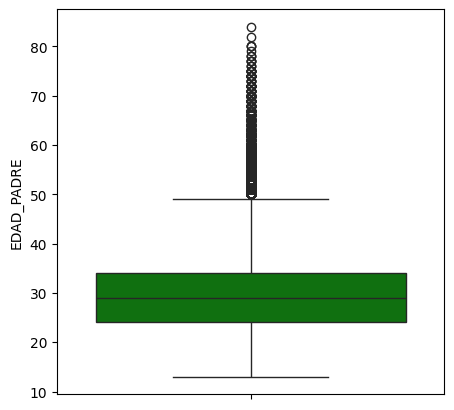

In [ ]:
plt.figure(figsize=(5, 5))
sns.boxplot(df1.EDAD_PADRE, color='green', saturation=0.75)
plt.show()

Se considera que la edad de un padre de un recién nacido en Colombia es atípica si es mayor que 50 años. El primer cuartil es aproximadamente 25 años, la media aritmética es aproximadamente 29 años y el tercer cuartil es aproximadamente 35 años.

$\text{Rango intercuartílico = Tercer cuartil - Primer cuartil} = 35 - 25 = 10$

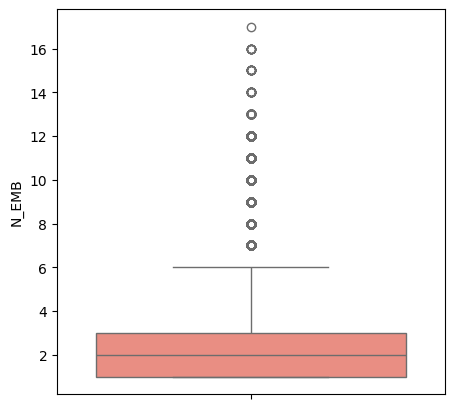

In [ ]:
plt.figure(figsize=(5, 5))
sns.boxplot(df1.N_EMB, color='salmon', saturation=0.75)
plt.show()

Se considera que la cantidad de embarazos incluyendo el presente en Colombia es atípica si es mayor que 6 embarazos. El primer cuartil es aproximadamente 1 embarazo, la media aritmética es aproximadamente 2 embarazos y el tercer cuartil es aproximadamente 3 embarazos.

Rango intercuartílico = Tercer cuartil - Primer cuartil=3−1=2

In [ ]:
plt.figure(figsize=(5, 5))
fig = px.strip(df1.EDAD_PADRE, orientation = 'h')
fig.show()

<Figure size 500x500 with 0 Axes>

De acuerdo con el diagrama de puntos se observa una alta variabilidad de la edad de un padre de un recién Nacido en Colombia

In [ ]:
plt.figure(figsize=(5, 5))
fig = px.strip(df1.N_EMB, orientation = 'h')
fig.show()

<Figure size 500x500 with 0 Axes>

De acuerdo con el diagrama de puntos se observa una alta variabilidad de números de embarazos en Colombia

In [ ]:
print(f"Media: {np.mean(df1.EDAD_PADRE)}")
print(f"Varianza {np.var(df1.EDAD_PADRE)} y la desviación estándar es de {np.std(df1.EDAD_PADRE)}")
print(f"Asimetría: {skew(df1.EDAD_PADRE)}")
print(f"Curtosis: {kurtosis(df1.EDAD_PADRE)}")

Media: 29.677776899767615
Varianza 58.1447930361801 y la desviación estándar es de 7.62527330894966
Asimetría: 0.8354644123854555
Curtosis: 0.9742935943340898




*   Aproximadamente el promedio de la edad de un padre de un recién nacido en Colombia es de 29.7 años
*   Aproximadamente la distancia entre los valores de la edad edad un padre de un recién nacido en Colombia y la media es de 7.62 años
*   La distribución de la edad de un padre de un recién nacido en Colombia es asimétrica positiva, es decir, la media es mayor que la moda de la variable aleatoria
*   La distribución es platicúrtica, es decir, hay una baja concentración de las edades de un padre de un recién nacido en Colombia con respecto a la media




In [ ]:
print(f"Media: {np.mean(df1.N_EMB)}")
print(f"Varianza {np.var(df1.N_EMB)} y la desviación estándar es de {np.std(df1.N_EMB)}")
print(f"Asimetría: {skew(df1.N_EMB)}")
print(f"Curtosis: {kurtosis(df1.N_EMB)}")

Media: 2.1018111916192677
Varianza 1.7487690571042107 y la desviación estándar es de 1.3224103210063851
Asimetría: 1.9224080210250476
Curtosis: 6.016780393777454


*   Aproximadamente el promedio de número de embarazos en Colombia es de 2 embarazos.

*   Aproximadamente la distancia entre los valores de número de embarazos teniendo en cuenta el presente en Colombia y la media es de 1.32 embarazos.

*   La distribución de número de embarazos en Colombia es asimétrica positiva, es decir, la media es mayor que la moda de la variable aleatoria.

*   La distribución es platicúrtica, es decir, hay una baja concentración de las edades de un padre de un recién nacido en Colombia con respecto a la media







*   Diagrama de dispersión y la recta de regresión para datos bivariados  

Una variable depende de la otra, cuando la ejecución de esta se ve afectada por la variable independiente.  ***Ejemplo*: El precio de una vivienda depende del número de habitaciones, ya que entre más habitaciones se tiene mayor precio.**

Una variable está correlacionada con otra, cuando guardan cierta relación, pero no es posible hablar de dependencia. ***Ejemplo*: Consumo de arroz y de carne, ya que se ha visto que al comerse más arroz se come más carne, pero no hay una dependencia entre estas dos variables**


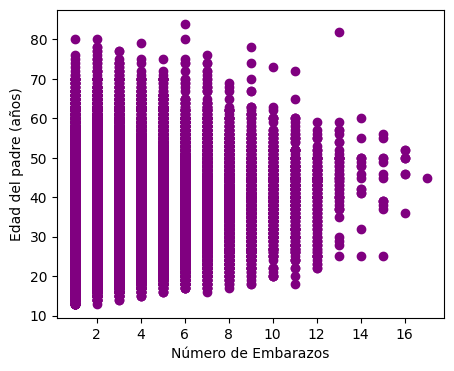

In [ ]:
plt.figure(figsize=(5, 4))
plt.scatter(df1["N_EMB"], df1["EDAD_PADRE"], color = "purple", marker = "o")
plt.xlabel('Número de Embarazos')
plt.ylabel('Edad del padre (años)')
plt.show()

Se observa en el diagrama de dispersión una nube de puntos sin un patrón particular pero bastante amplia al principio, esto quiere decir que las variables son independientes o no están correlacionadas. Para nuestro ejemplo quiere decir que el número de embarazos y la edad de un padre en Colombia no están correlacionadas (La mayoría de los padres se encuentran en el rango de edad entre 30 y 50 años. - La mayoría de los embarazos se concentran entre 2 y 10, con una menor frecuencia de embarazos más altos)

In [ ]:
modelo = LinearRegression()
# df1["N_EMB"] es igual a escribir df1.N_EMB
modelo.fit(np.array(df1.N_EMB).reshape(-1, 1), np.array(df1["EDAD_PADRE"]).reshape(-1, 1))
predi_lineal = modelo.predict(np.array(df1.N_EMB).reshape(-1, 1))
predi_lineal

array([[27.43534225],
       [27.43534225],
       [27.43534225],
       ...,
       [29.47056813],
       [27.43534225],
       [27.43534225]])

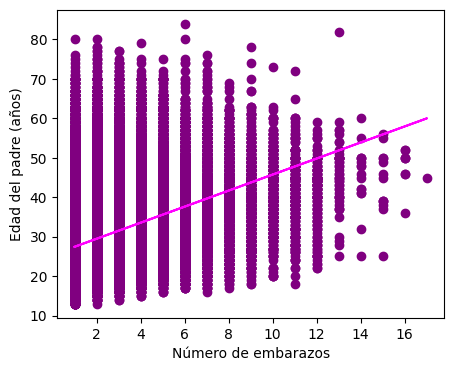

In [ ]:
plt.figure(figsize=(5, 4))
plt.scatter(df1["N_EMB"], df1["EDAD_PADRE"], color = "purple", marker = "o")
plt.plot(df1["N_EMB"], predi_lineal, linestyle='-', color = "magenta")
plt.xlabel('Número de embarazos')
plt.ylabel('Edad del padre (años)')
plt.show()

De acuerdo con la recta de regresión se determina una correlación positiva y La nube de puntos en el gráfico muestra una tendencia positiva... Es decir, que entre más numeros de embarazos hay en Colombia, más años tiene el padre. en general, los padres de mayor edad dejan mas números de embarazo que los padres de menor edad.



*La variable Y depende positivamente de la variable X, es decir, entre mayor valor de X se tenga, mayor será el valor de Y*

In [ ]:
coef_pearson = np.corrcoef(df1["N_EMB"], df1["EDAD_PADRE"])[0, 1]
coef_spearman, _ = spearmanr(df1["N_EMB"], df1["EDAD_PADRE"])
coef_kendall, _ = kendalltau(df1["N_EMB"], df1["EDAD_PADRE"])
print(f"Los coeficientes de correlación de Pearson, Spearman y Kendall son respectivamente {coef_pearson}, {coef_spearman} y {coef_kendall}.")

Los coeficientes de correlación de Pearson, Spearman y Kendall son respectivamente 0.3529583266676772, 0.37985917047049816 y 0.29686774207661487.


Para la interpretación de los coeficientes de correlación nos ayudaremos de la referencia:

Landis, J. R., & Koch, G. G. (1977). The measurement of observer agreement for categorical data. biometrics, 159-174. [Link](https://www.jstor.org/stable/pdf/2529310.pdf)



*   X y Y son independientes o no están correlacionadas: $\rho (X,Y) \approx 0, \eta (X,Y) \approx 0, \kappa (X,Y) \approx 0$
*   Y depende insignificantemente de X o X y Y están insignificantmente correlacionadas si $0 < \vert \rho (X,Y) \vert < 0.2$, $0 < \eta (X,Y) \vert < 0.2$, $0 < \vert \kappa (X,Y) \vert < 0.2$
*   Y depende discretamente de X o X y Y están discretamente correlacionadas si $0.2 < \vert \rho (X,Y) \vert < 0.4$, $0.2 < \eta (X,Y) \vert < 0.4$, $0.2 < \vert \kappa (X,Y) \vert < 0.4$
*   Y depende moderadamente de X o X y Y están moderadamente correlacionadas si $0.4 < \vert \rho (X,Y) \vert < 0.6$, $0.4 < \eta (X,Y) \vert < 0.6$, $0.4 < \vert \kappa (X,Y) \vert < 0.6$
*   Y depende sustancialmente de X o X y Y están sustancialmente correlacionadas si $0.6 < \vert \rho (X,Y) \vert < 0.8$, $0.6 < \eta (X,Y) \vert < 0.8$, $0.6 < \vert \kappa (X,Y) \vert < 0.8$
*   Y depende fuertemente de X o X y Y están fuertmente correlacionadas si $0.8 < \vert \rho (X,Y) \vert < 1$, $0.8 < \eta (X,Y) \vert < 1$, $0.8 < \vert \kappa (X,Y) \vert < 1$


De acuerdo con los coeficientes de correlación de Pearson, de Kendall y de Spearman se determina que el número de embarazos de una mujer  y la edad de un padre de un recién nacido en Colombia están discretamente correlacionadas.Teniendo en cuenta, lo interpretado en la referencia obtenida.

**CONCLUSIONES**
⚛Al analizar las variables "Edad del padre de un recién nacido" y "Número de embarazos incluyendo el presente" en Colombia, se pueden observar diferentes patrones y relaciones entre estos factores demográficos.

La edad de los padres de recién nacidos en Colombia muestra una distribución asimétrica positiva, con la mayoría de los padres concentrados en el rango de 20 a 40 años, y una mediana alrededor de los 30 años. Esta distribución refleja una tendencia hacia la paternidad en edades relativamente jóvenes, aunque se observa una cola larga hacia edades más avanzadas, incluyendo algunos casos atípicos de padres de edad muy avanzada.

Por otro lado, la variable del número de embarazos presenta una distribución fuertemente sesgada hacia la derecha, con una gran concentración en el primer embarazo. Esto sugiere que una proporción significativa de los casos estudiados corresponden a padres primerizos, mientras que los casos de múltiples embarazos son menos frecuentes y aparecen como valores atípicos en la distribución.

Al examinar la relación entre estas dos variables, se observa una correlación positiva, aunque de magnitud discreta a moderada (con el rango 0.2 < |ρ(X,Y)| < 0.4 según la escala de Landis y Koch). Esto indica que, en general, a medida que aumenta la edad del padre, tiende a aumentar ligeramente el número de embarazos. Sin embargo, la correlación no es lo suficientemente fuerte como para establecer una relación determinante entre ambas variables.

**REFERENCIAS**

⚛Departamento Administrativo Nacional de Estadística. (2020 - 2022). Encuesta Nacional de Calidad de Vida 2020: Nacimiento y defunción (nac2020). DANE. https://microdatos.dane.gov.co/index.php/catalog/732/study-description